#  Прогнозирование заказов такси

Аггрегатор такси собрал исторические данные о заказах такси в аэропортах. Чтобы привлекать больше водителей в период пиковой нагрузки, нужно спрогнозировать количество заказов такси на следующий час. Необходимо построить модель для такого предсказания.

Значение метрики *RMSE* на тестовой выборке должно быть не больше 48.

Данные лежат в файле `taxi.csv`. Количество заказов находится в столбце `num_orders`.

## Подготовка

In [1]:
# Установка библиотек

!pip install phik
!pip install --upgrade scikit-learn
!pip install catboost

In [2]:
# Импорт библиотек

import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

import plotly.graph_objects as go
import plotly.express as px

from sklearn.metrics import root_mean_squared_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from phik import phik_matrix

from catboost import CatBoostRegressor

import lightgbm as lgb

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf

import time

import os

In [3]:
# Загрузка данных

try:
    path = '/datasets/taxi.csv'
    data = pd.read_csv(path, index_col=[0], parse_dates=[0])

except FileNotFoundError:
    current_directory = os.getcwd()
    data = pd.read_csv(current_directory + path, index_col=[0], parse_dates=[0])

In [4]:
display(data.info())

# Назначение индексов

data.sort_index(inplace=True)

# Поиск пропусков

print()
print('Пропуски:', data.isna().sum())
print()

#Ресэмплинг почасово

data = data.resample('1H').sum()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26496 entries, 2018-03-01 00:00:00 to 2018-08-31 23:50:00
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   num_orders  26496 non-null  int64
dtypes: int64(1)
memory usage: 414.0 KB


None


Пропуски: num_orders    0
dtype: int64



/var/folders/2r/zfmtb66x3rs14ctpbj7lhdt40000gp/T/ipykernel_19445/1415298997.py:15: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  data = data.resample('1H').sum()


,num_orders
datetime,
2018-07-07 00:00:00,190
2018-03-17 20:00:00,57
2018-04-04 11:00:00,66
2018-06-05 18:00:00,60
2018-04-30 10:00:00,120


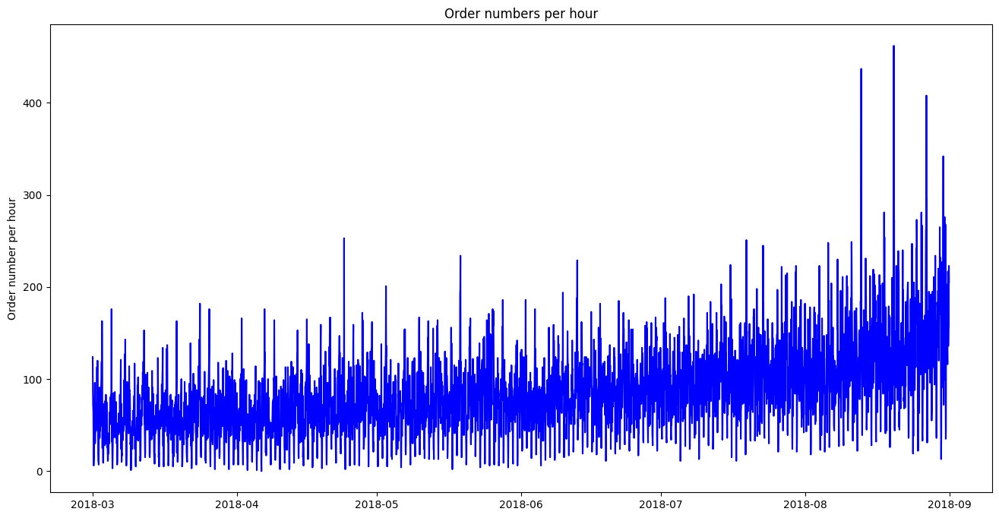

In [5]:
# Вывод датафрейма

display(data.sample(5))

# Визуализация

plt.figure(figsize=(16, 8))
plt.plot(data.index, data['num_orders'], linestyle='-', color='b')
plt.ylabel('Order number per hour')
plt.title('Order numbers per hour');

### Выводы

Загружен датасет с историческими данными. Произведена первичная обработка и ресемплинг.

## Анализ

### Первичный анализ

In [6]:
# Общие сведения о заказах

data.describe()

,num_orders
count,4416.000000
mean,84.422781
std,45.023853
min,0.000000
25%,54.000000
50%,78.000000
75%,107.000000
max,462.000000


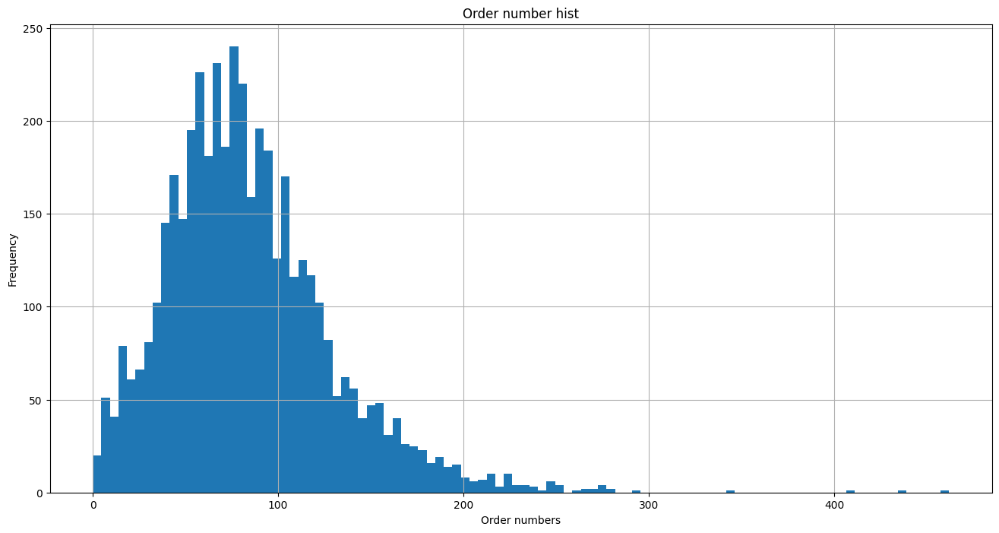

In [7]:
# Гистограмма

plt.figure(figsize = (16,8))
plt.hist(data, bins = 100)
plt.ylabel('Frequency')
plt.xlabel('Order numbers')
plt.title('Order number hist')
plt.grid(True);

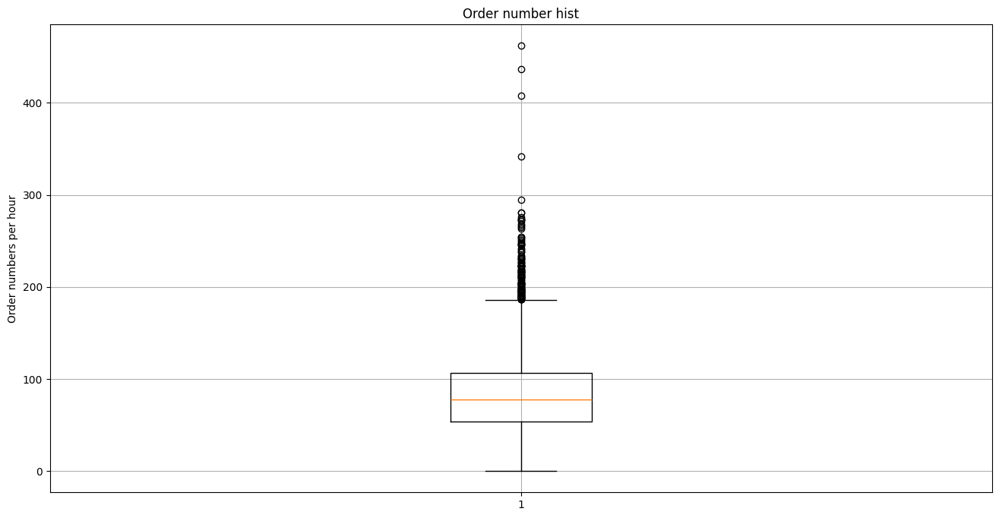

In [8]:
# Boxplot

plt.figure(figsize = (16,8))
plt.boxplot(data)
plt.ylabel('Order numbers per hour')
plt.title('Order number hist')
plt.grid(True);

In [9]:
data[data['num_orders']>250].sample(5)

,num_orders
datetime,
2018-08-26 00:00:00,281
2018-08-18 02:00:00,254
2018-08-31 04:00:00,268
2018-08-18 00:00:00,281
2018-04-24 00:00:00,253


Наблюдается некоторое количество выбросов, в основном они происходят в вечернее и ночное время.

### Анализ трендов и сезонности

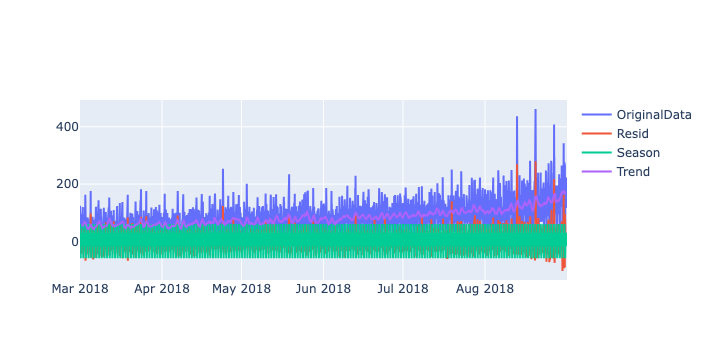

In [10]:
decomposed = seasonal_decompose(data['num_orders'].dropna())

fig = go.Figure()

fig.add_trace(go.Scatter(x=data['num_orders'].dropna().index, y=data['num_orders'].dropna(),
                    mode='lines',
                    name='OriginalData'))

fig.add_trace(go.Scatter(x = decomposed.resid.index, y = decomposed.resid,
                    mode='lines',
                    name='Resid'))

fig.add_trace(go.Scatter(x = decomposed.seasonal.index, y = decomposed.seasonal,
                    mode='lines',
                    name='Season'))

fig.add_trace(go.Scatter(x = decomposed.trend.index, y = decomposed.trend,
                    mode='lines',
                    name='Trend'))

/var/folders/2r/zfmtb66x3rs14ctpbj7lhdt40000gp/T/ipykernel_19445/122445324.py:16: RuntimeWarning:

divide by zero encountered in divide



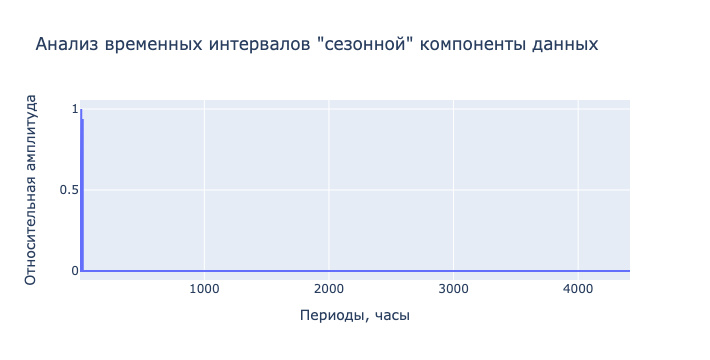

In [11]:
# Фурье преобразование сезонной компоненты

T = 1   # Интервал между отсчетами 1 час
L = len(decomposed.seasonal)   # Длина датасета
t = np.arange(0, L*T, T)  # Временная ось, часы

# Выполнение FFT

N = len(data)
Y = np.fft.fft(decomposed.seasonal)
Y = Y/np.max(Y)
Y = Y[range(N//2)]  # Только положительные частоты

# Создание временной оси

frequencies = 1/np.arange(0, (1/(2*T)), (1/(2*T))/len(Y))


fig = go.Figure()
fig.add_trace(go.Scatter(x=frequencies, y=np.abs(Y), mode='lines', name='FFT'))
fig.update_layout(title='Анализ временных интервалов "сезонной" компоненты данных',
                  xaxis_title='Периоды, часы',
                  yaxis_title='Относительная амплитуда')
fig.show();

Text(0.5, 1.0, 'Коррелограмма остатков')

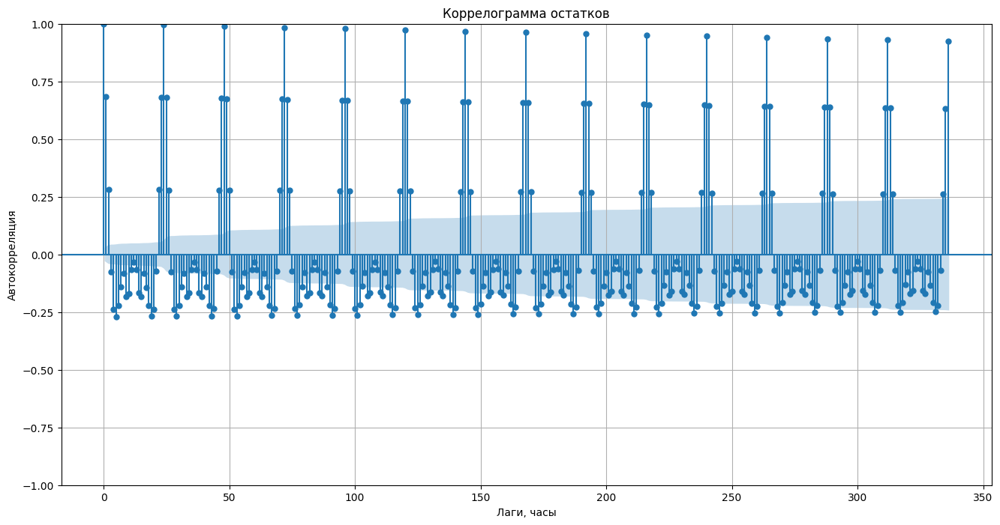

In [12]:
# Построение коррелограммы сезонной компоненты

corr_data_seasonal = decomposed.seasonal.dropna()

fig, ax = plt.subplots(figsize=(16, 8))

# Построение коррелограммы с использованием fig и ax

plot_acf(corr_data_seasonal, lags=24*14, ax=ax)  # lags - количество лагов для отображения

plt.xlabel('Лаги, часы')
plt.ylabel('Автокорреляция')
plt.grid(True)
plt.title('Коррелограмма остатков')

RMS остаточной компоненты: 24.694084222676633


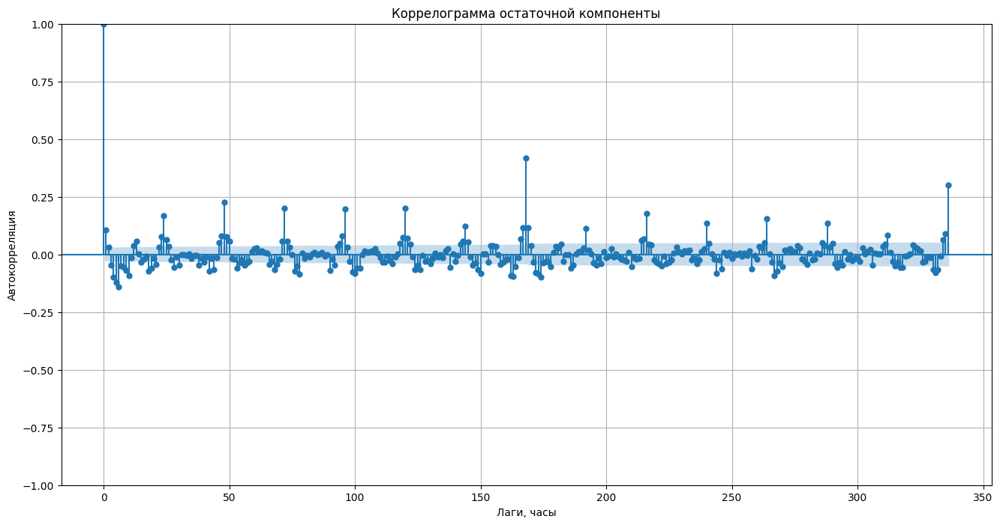

In [13]:
# Построение коррелограммы остаточной компоненты

corr_data_resid = decomposed.resid.dropna()

fig, ax = plt.subplots(figsize=(16, 8))

# Построение коррелограммы с использованием fig и ax

plot_acf(corr_data_resid, lags=24*14, ax=ax)  # lags - количество лагов для отображения

plt.xlabel('Лаги, часы')
plt.ylabel('Автокорреляция')
plt.grid(True)
plt.title('Коррелограмма остаточной компоненты')
print('RMS остаточной компоненты:', np.std(corr_data_resid))

#### Выводы
В ходе временного и частотного анализа удалось выявить следующие закономерности.

Тренд восходящий, это значит, что количество заказов на выбранном интервале времени датасета возрастает со временем и ряд нестационарен. 

На Фурье преобразовании сезонной компоненты наиболее заметны следующие интервалы: 12 часов, 24 часа, 8 часов, 6 часов, 4 часа. В целом, они выглядят логичными и их можно попробовать увязать с внутридневными циклами жизни людей.
На кореллограмме сезонной компоненты заметны пики с регулярностью 24 часа, что совпадает с результатами Фурье преобразования.

Согласно анализу суточных периодов, локальные максимумы заказов наблюдаются в 2, 10, 16 и 24 часа, локальные минимумы в 6, 12 и 18 часов. Судя по всему, в этот аэропорт по большей части совершается большое количество регулярных рейсов ежедневно. 

Компонента остатков содержит на кореллограмме суточные пики, а также еженедельные.

Компонента остатков выглядит достаточно равномерной с выбросами, учащающимися и увеличивающимися со временем, что согласуется с растущим трендом.

### Feature engineering

In [14]:
# Создадим функцию, которое добавляет столбцы с часами, числом, днем недели, месяцем, а также прошлые данные и скользящее среднее

def make_features(data, max_lag, rolling_mean_size):
    data['hour'] = data.index.hour
    data['day'] = data.index.day
    data['dayofweek'] = data.index.dayofweek

    for lag in range(1, max_lag + 1):
        data['lag_{}'.format(lag)] = data['num_orders'].shift(lag)

    data['rolling_mean'] = data['num_orders'].shift().rolling(rolling_mean_size).mean()

In [15]:
# Создаем новые фичи в датасете с помощью функции

make_features(data, 8, 24)

data_final = data.dropna()
data_final.sample(15)

,num_orders,hour,day,dayofweek,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,rolling_mean
datetime,,,,,,,,,,,,,
2018-06-17 20:00:00,71,20,17,6,78.0,37.0,124.0,156.0,91.0,91.0,50.0,88.0,80.291667
2018-05-13 07:00:00,13,7,13,6,23.0,24.0,61.0,155.0,71.0,59.0,95.0,71.0,65.041667
2018-06-10 04:00:00,88,4,10,6,106.0,101.0,83.0,194.0,114.0,110.0,88.0,119.0,90.125000
2018-07-03 19:00:00,95,19,3,1,78.0,108.0,130.0,95.0,79.0,58.0,81.0,93.0,85.958333
2018-07-10 18:00:00,74,18,10,1,108.0,120.0,80.0,97.0,77.0,72.0,98.0,103.0,90.416667
2018-07-17 17:00:00,120,17,17,1,57.0,97.0,74.0,49.0,66.0,121.0,79.0,108.0,86.833333
2018-04-02 11:00:00,82,11,2,0,111.0,57.0,62.0,7.0,20.0,33.0,33.0,47.0,62.791667
2018-03-09 04:00:00,30,4,9,4,31.0,29.0,66.0,84.0,79.0,88.0,86.0,114.0,63.125000
2018-03-11 23:00:00,118,23,11,6,89.0,119.0,99.0,99.0,107.0,78.0,93.0,60.0,64.791667


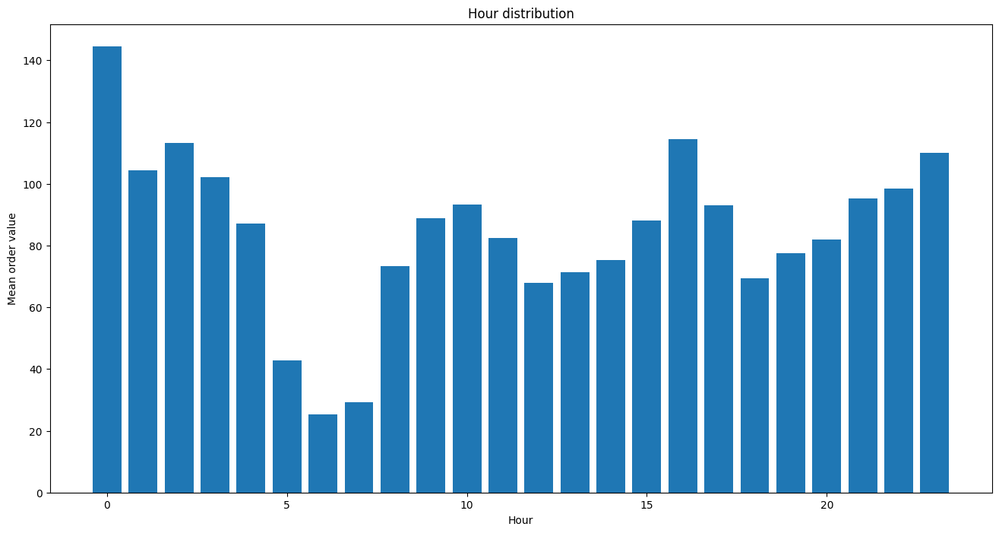

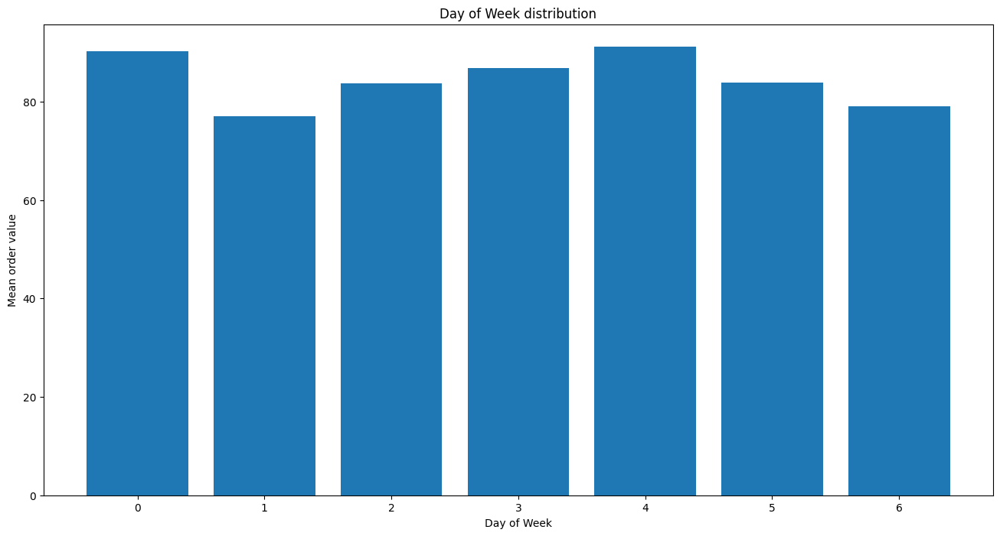

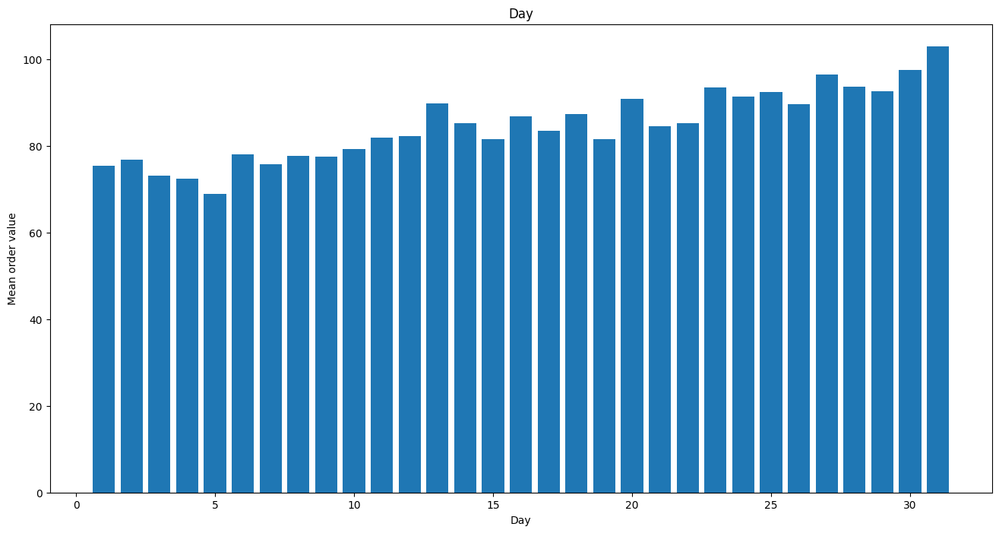

In [16]:
# Рассмотрим распределение данных, сгруппированных по отдельным признакам

# по часам

hour = data_final.groupby(by = 'hour').mean()['num_orders']
plt.figure(figsize = (16,8))
plt.bar(hour.index, hour)
plt.title('Hour distribution')
plt.xlabel('Hour')
plt.ylabel('Mean order value')
plt.show()

# по дням недели

week = data_final.groupby(by = 'dayofweek').mean()['num_orders']
plt.figure(figsize = (16,8))
plt.bar(week.index, week)
plt.title('Day of Week distribution')
plt.xlabel('Day of Week')
plt.ylabel('Mean order value')
plt.show()

# по числу

day = data_final.groupby(by = 'day').mean()['num_orders']
plt.figure(figsize = (16,8))
plt.bar(day.index, day)
plt.title('Day')
plt.xlabel('Day')
plt.ylabel('Mean order value')
plt.show()


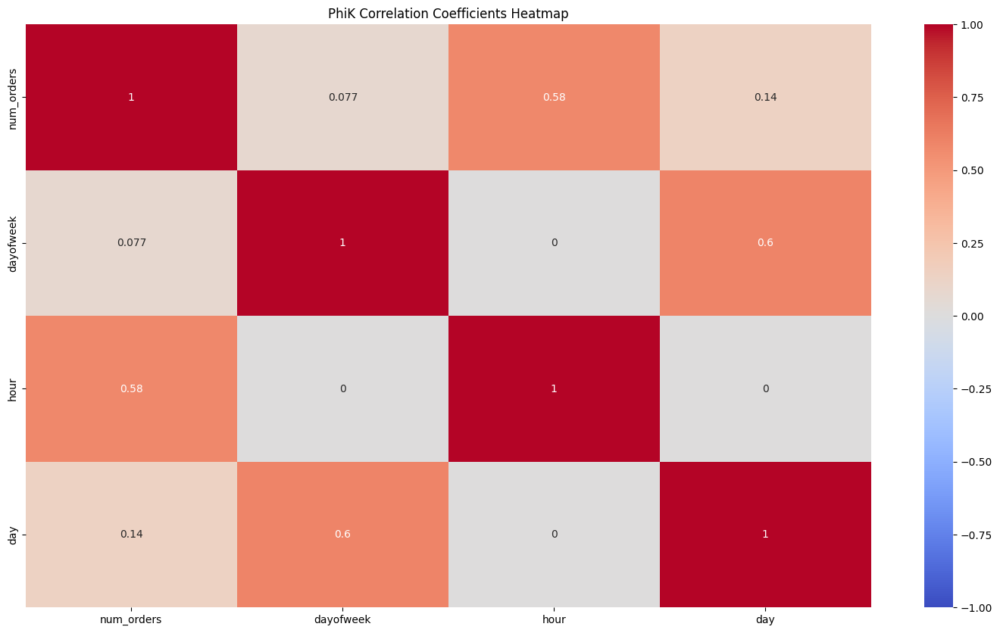

In [17]:
# Выбираем интересующие нас числовые признаки

interval_cols = ['num_orders']

# Вычисляем матрицу корреляции с использованием phik

phik_corr_matrix = phik_matrix(data_final[['num_orders', 'dayofweek', 'hour', 'day']], interval_cols=interval_cols)

plt.figure(figsize=(18, 10))
sns.heatmap(phik_corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('PhiK Correlation Coefficients Heatmap')
plt.show();

#### Выводы

Корреляционный анализ и столбчатые диаграммы продемонстрировали схожие результаты зависимости целевого признака и новых фичей. Количество заказов коррелирует со временем, растет со временем и слабо зависит от числа и дня недели.



## Обучение

### Создание тестовой и тренировочной выборок

In [18]:
# Data split

train, test = train_test_split(data_final, shuffle=False, test_size=0.1, random_state=42)
train = train.dropna()

y_train = train['num_orders']
X_train = train.drop('num_orders', axis = 1)

y_test = test['num_orders']
X_test = test.drop('num_orders', axis = 1)


### CatBoostRegressor model

In [19]:
# Создаем модель CatBoostRegressor

model_cb = CatBoostRegressor(random_state = 41, verbose = False)

In [20]:
# Задаем сетку параметров для GridSearchCV

param_grid = {
    'learning_rate': [0.01, 0.03, 0.1],
    'depth': [3, 6, 8],
    'l2_leaf_reg': [0.1, 1, 5],
    'iterations': [500]
}

In [21]:
# Инициализируем TimeSeriesSplit для кросс-валидации временных рядов

tscv = TimeSeriesSplit(n_splits=3)

In [22]:
grid_search_cb = GridSearchCV(estimator=model_cb, param_grid=param_grid, scoring='neg_mean_squared_error', cv=tscv, verbose=1, n_jobs=-1, error_score='raise')
grid_search_cb.fit(X_train, y_train)
best_params_cb = grid_search_cb.best_params_
best_model_cb = grid_search_cb.best_estimator_

Fitting 3 folds for each of 27 candidates, totalling 81 fits


In [23]:
# Результаты обучения и получение RMSE метрик на тестовом и тренировочном наборах

print("Best Hyperparameters CatBoostRegressor:", best_params_cb)
print("Best CatBoostRegressor model CV RMSE:", best_model_cb.best_score_)

y_pred_train_cb = best_model_cb.predict(X_train)
rmse_train_cb = mean_squared_error(y_train, y_pred_train_cb, squared = False)
print("Best CatBoostRegressor model Train RMSE:", rmse_train_cb)
print("Best CatBoostRegressor model Train mean residual:", np.mean(y_train - y_pred_train_cb))

Best Hyperparameters CatBoostRegressor: {'depth': 3, 'iterations': 500, 'l2_leaf_reg': 1, 'learning_rate': 0.1}
Best CatBoostRegressor model CV RMSE: {'learn': {'RMSE': 18.228244040730306}}
Best CatBoostRegressor model Train RMSE: 18.228244040730313
Best CatBoostRegressor model Train mean residual: 0.0023369308604390755


/Users/NOrlov/myenv/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [24]:
# Замер времени обучения лучшей модели

start_time = time.time()

time_model_cb = best_model_cb
time_model_cb.fit(X_train, y_train)
training_time_cb = time.time() - start_time

# Замер времени предсказания лучшей модели

start_time = time.time()
y_pred_cb = time_model_cb.predict(X_train)
prediction_time_cb = time.time() - start_time

print('CatBoostRegressor model training time, s:', training_time_cb)
print('CatBoostRegressor model prediction time, s:', prediction_time_cb)

CatBoostRegressor model training time, s: 0.29205894470214844
CatBoostRegressor model prediction time, s: 0.0012660026550292969


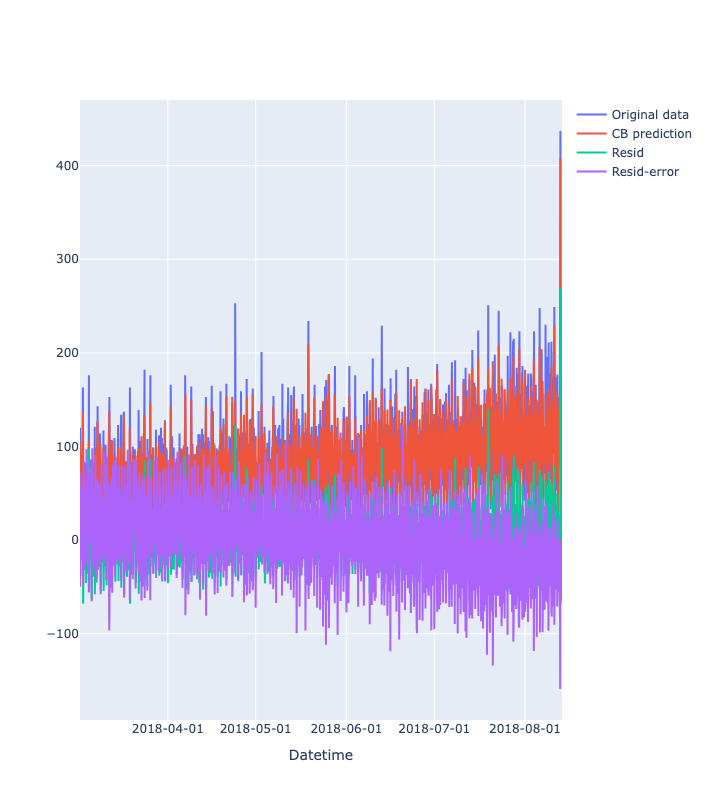

In [25]:
# Визуализация y_true, y_pred, resid и их разницы для наглядности

fig = go.Figure()

fig.add_trace(go.Scatter(x=X_train.index, y=y_train,
                    mode='lines',
                    name='Original data'))

fig.add_trace(go.Scatter(x = X_train.index, y = y_pred_train_cb,
                    mode='lines',
                    name='CB prediction'))

fig.add_trace(go.Scatter(x = X_train.index, y = decomposed.resid.loc[X_train.index],
                    mode='lines',
                    name='Resid'))

fig.add_trace(go.Scatter(x = X_train.index, y = decomposed.resid.loc[X_train.index] + y_pred_train_cb.mean() - y_pred_train_cb,
                    mode='lines',
                    name='Resid-error'))

fig.update_layout(xaxis_tickformat='%Y-%m-%d', xaxis_title='Datetime')
fig.update_layout(width=1000, height=800)
fig.show()

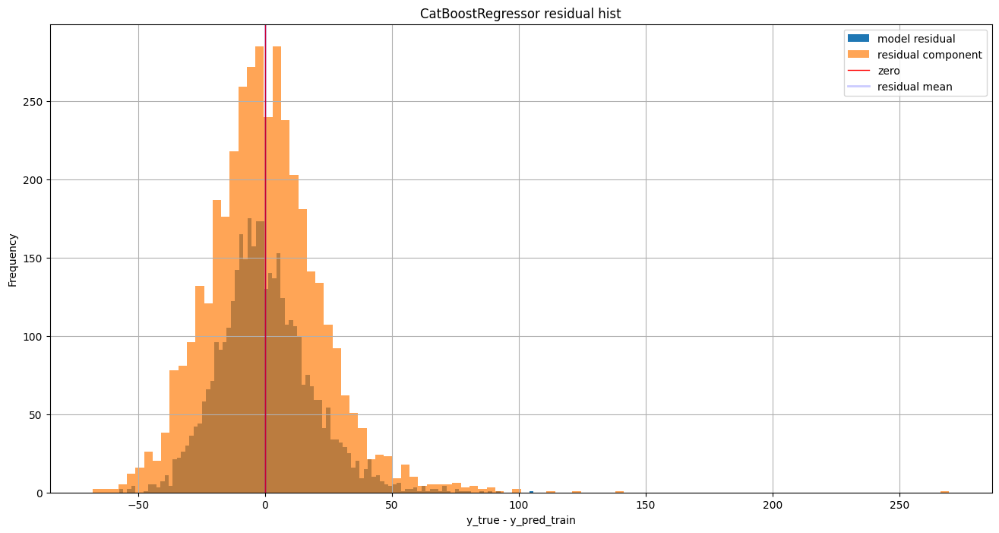

In [26]:
# Построение гистограммы остатков на Train наборе

plt.figure(figsize = (16,8))
plt.hist(y_train - y_pred_train_cb, bins=100, label = 'model residual')
plt.hist(decomposed.resid.loc[X_train.index], bins=100, alpha = 0.7, label = 'residual component')
plt.xlabel('y_true - y_pred_train')
plt.ylabel('Frequency')
plt.axvline(x=0, color='r', linestyle='-', linewidth=1, label = 'zero')
plt.axvline(x=np.mean(y_train - y_pred_train_cb), color='b', linestyle='-', linewidth=2, alpha = 0.2, label = 'residual mean')
plt.legend()
plt.title('CatBoostRegressor residual hist')
plt.grid('true')
plt.show();

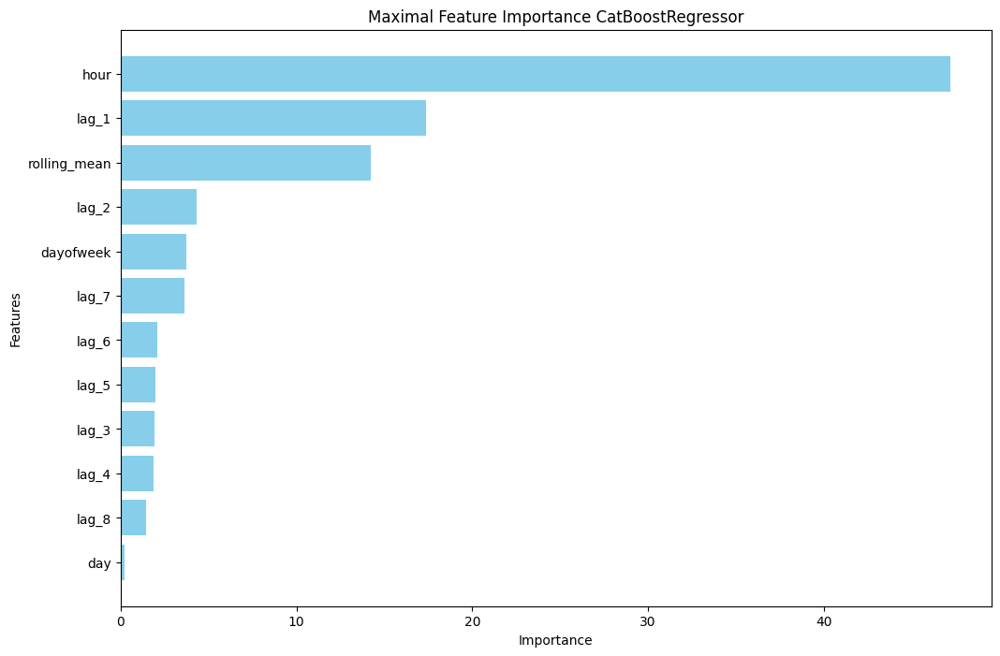

In [27]:
# Поиск наиболее и наименее значимых фичей

all_feature_names = X_train.columns

feature_importances = best_model_cb.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': feature_importances
})

# Максимальные признаки

feature_importance_df_max = feature_importance_df.sort_values(
    by='Importance', ascending=False
)
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df_max['Feature'], feature_importance_df_max['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Maximal Feature Importance CatBoostRegressor')
plt.gca().invert_yaxis()
plt.show()


#### CatBoostRegressor Выводы

Модель с лучшими гиперпараметрами продемонстрировала на кросс-валидации метрику RMSE лучше порогового значения.

Анализ остатков показал нормальное распределение, остатки на тренировочной выборке имеют нулевое среднее. Остаточная компонента и остатки модели имеют большие коррелирующие между собой единичные выбросы.

Анализ важности фичей подтвердил адекватность модели: время суток, информация предыдщего часа и скользящее среднее больше всего влияют на предсказание. Данные с большой задержкой и календарное число оказывают наименьшее влияние на результат предсказания.

### LightGBM model

In [28]:
# Задаем сетку параметров для GridSearchCV

params_lgb = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'rmse',
    'max_depth': -1,
    'min_child_samples': 20,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'reg_alpha': 0.0,
    'reg_lambda': 0.0,
    'verbose': 0,
    'force_col_wise': True,
    'n_estimators' : 500
}

param_grid_lgb = {
    'num_leaves': [10, 20, 30],
    'learning_rate': [0.01, 0.03, 0.1]
}

# Создаем модель LightGBM

model_lgb = lgb.LGBMRegressor(**params_lgb, random_state=42)


grid_search_lgb = GridSearchCV(estimator=model_lgb, param_grid=param_grid_lgb, scoring='neg_mean_squared_error', cv=tscv, verbose=1, n_jobs=-1, error_score='raise')
grid_search_lgb.fit(X_train, y_train)
best_params_lgb = grid_search_lgb.best_params_
best_model_lgb = grid_search_lgb.best_estimator_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


In [29]:
# Результаты обучения и получение RMSE метрик на тренировочном наборе

print("Best Hyperparameters LightGBM:", best_params_lgb)
print("Best LightGBM model CV RMSE:", best_model_cb.best_score_)

y_pred_train_lgb = best_model_lgb.predict(X_train)
rmse_train_lgb = mean_squared_error(y_train, y_pred_train_lgb, squared = False)

print("Best LightGBM model Train RMSE:", rmse_train_lgb)
print("Best LightGBM Train mean residual:", np.mean(y_train - y_pred_train_lgb))

Best Hyperparameters LightGBM: {'learning_rate': 0.01, 'num_leaves': 30}
Best LightGBM model CV RMSE: {'learn': {'RMSE': 18.228244040730306}}
Best LightGBM model Train RMSE: 17.493857826582488
Best LightGBM Train mean residual: 1.5362727913915024e-10


/Users/NOrlov/myenv/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [30]:
# Замер времени обучения лучшей модели

start_time = time.time()
time_model_lgb = best_model_lgb
time_model_lgb.fit(X_train, y_train)
training_time_lgb = time.time() - start_time

# Замер времени предсказания лучшей модели

start_time = time.time()
y_pred_lgb = time_model_lgb.predict(X_train)
prediction_time_lgb = time.time() - start_time

print('LightGBM model training time, s:', training_time_lgb)
print('LightGBM model prediction time, s:', prediction_time_lgb)

LightGBM model training time, s: 1.1269159317016602
LightGBM model prediction time, s: 0.027966022491455078


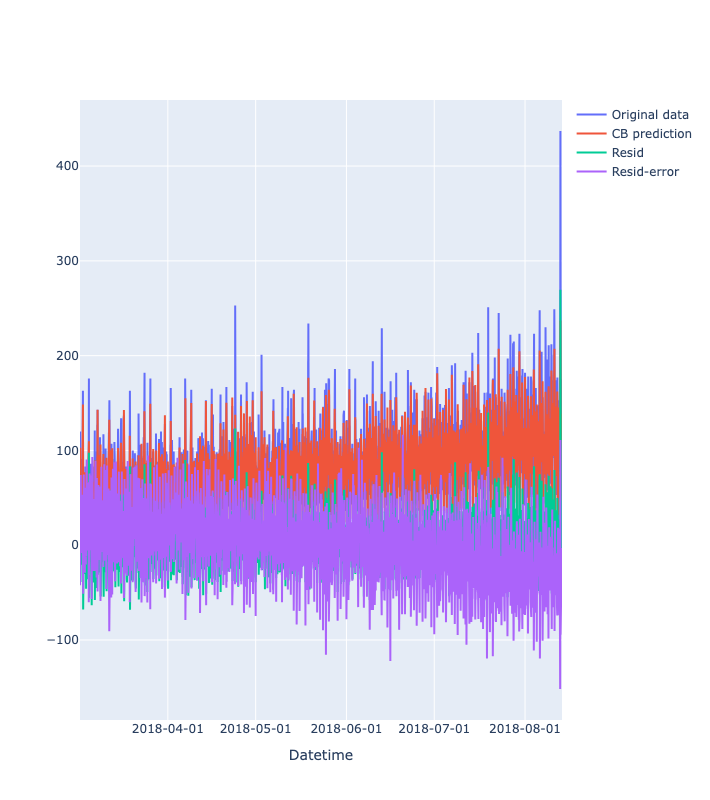

In [31]:
# Визуализация y_true, y_pred, resid и их разницы для наглядности

fig = go.Figure()

fig.add_trace(go.Scatter(x=X_train.index, y=y_train,
                    mode='lines',
                    name='Original data'))

fig.add_trace(go.Scatter(x = X_train.index, y = y_pred_train_lgb,
                    mode='lines',
                    name='CB prediction'))

fig.add_trace(go.Scatter(x = X_train.index, y = decomposed.resid.loc[X_train.index],
                    mode='lines',
                    name='Resid'))

fig.add_trace(go.Scatter(x = X_train.index, y = decomposed.resid.loc[X_train.index] + y_pred_train_lgb.mean() - y_pred_train_lgb,
                    mode='lines',
                    name='Resid-error'))

fig.update_layout(xaxis_tickformat='%Y-%m-%d', xaxis_title='Datetime')
fig.update_layout(width=1000, height=800)
fig.show()

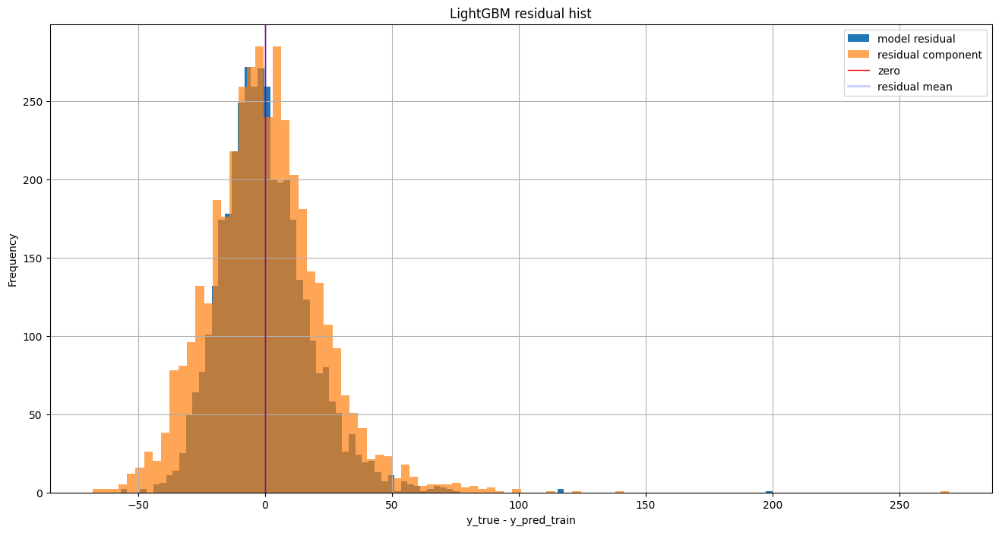

In [32]:
# Построение гистограммы остатков

plt.figure(figsize = (16,8))
plt.hist(y_train - y_pred_train_lgb, bins=100, label = 'model residual')
plt.hist(decomposed.resid.loc[X_train.index], bins=100, alpha = 0.7, label = 'residual component')
plt.xlabel('y_true - y_pred_train')
plt.ylabel('Frequency')
plt.axvline(x=0, color='r', linestyle='-', linewidth=1, label = 'zero')
plt.axvline(x=np.mean(y_train - y_pred_train_lgb), color='b', linestyle='-', linewidth=2, alpha = 0.2, label = 'residual mean')
plt.legend()
plt.title('LightGBM residual hist')
plt.grid('true')
plt.show();


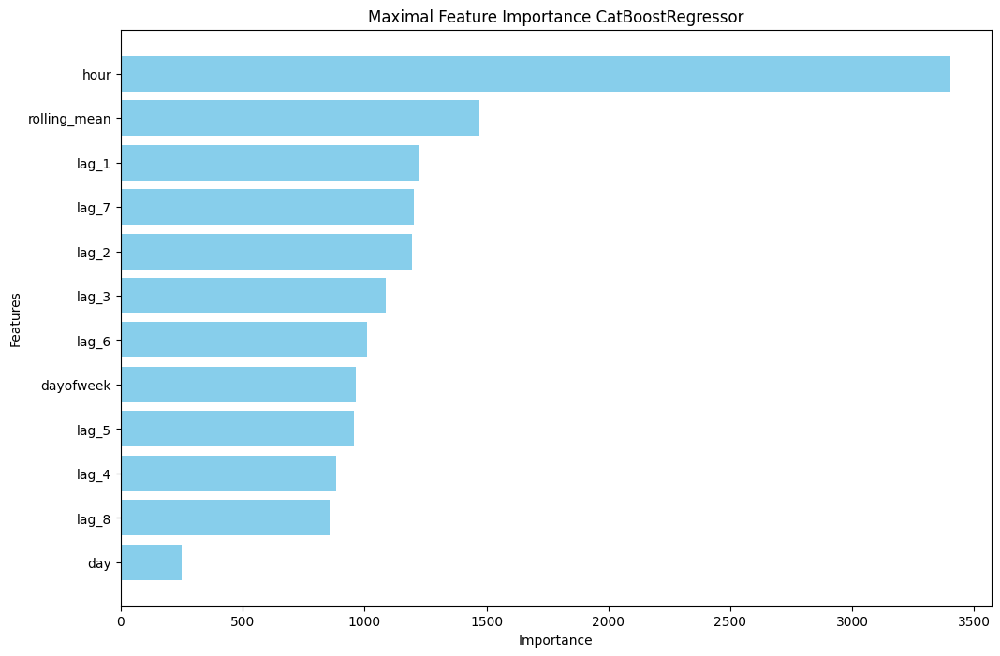

In [33]:
# Поиск наиболее и наименее значимых фичей

feature_importances = best_model_lgb.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': feature_importances
})

# Максимальные признаки

feature_importance_df_max = feature_importance_df.sort_values(
    by='Importance', ascending=False
)
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df_max['Feature'], feature_importance_df_max['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Maximal Feature Importance CatBoostRegressor')
plt.gca().invert_yaxis()
plt.show()


#### LightGBM Выводы

Модель LightGBM с лучшими гиперпараметрами продемонстрировала кросс-валидационную метрику RMSE лучше порогового.

Анализ остатков показал нормальное распределение, остатки на тренировочной выборке имеют нулевое среднее. Остаточная компонента и остатки модели имеют большие коррелирующие между собой единичные выбросы.

Анализ важности фичей подтвердил адекватность модели: время суток и информация предыдущего часа и скользящее среднее больше всего влияют на предсказание. С другой стороны, число и данные с большой задержкой оказывают наименьшее влияние на результат предсказания, что выглядит логично. 

### Выводы
Выбираем модель CatBoostRegressor в качестве финальной. Метрики RMSE двух моделей отличаются крайне незначительно, однако время обучения и время предсказания CatBoostRegressor на 2 порядка меньше, чем соответствующие времена LightGBM.

## Анализ модели

In [34]:
# Результаты обучения и получение RMSE метрик на тестовом и тренировочном наборах

y_pred_test_cb = best_model_cb.predict(X_test)
rmse_test_cb = mean_squared_error(y_test, y_pred_test_cb, squared = False)
print("Best CatBoostRegressor model Test RMSE:", rmse_test_cb)
print("Best CatBoostRegressor model Test mean residual:", np.mean(y_test - y_pred_test_cb))

Best CatBoostRegressor model Test RMSE: 44.039583298055476
Best CatBoostRegressor model Test mean residual: 14.394662367664692


/Users/NOrlov/myenv/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



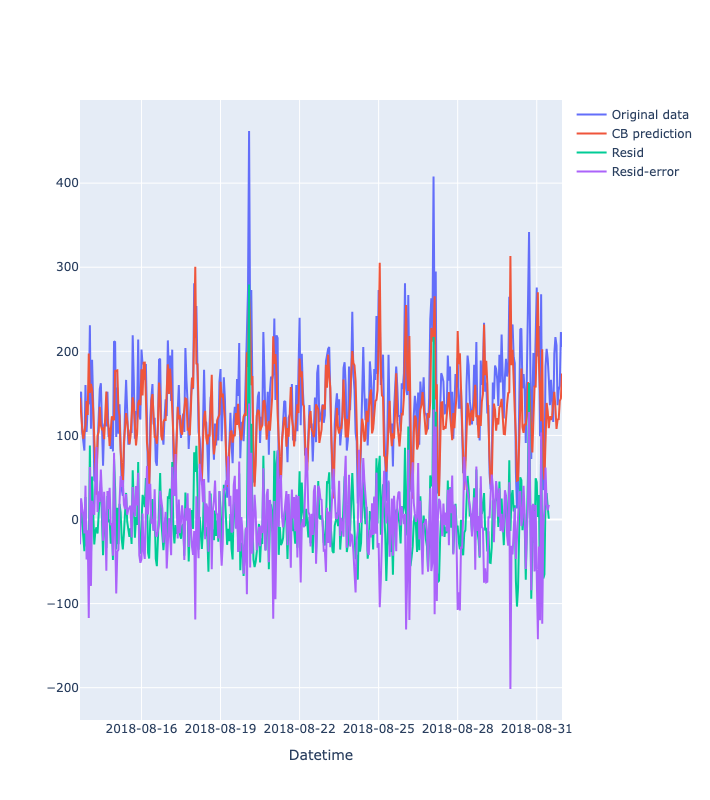

In [35]:
# Визуализация y_true, y_pred, resid и их разницы для наглядности

fig = go.Figure()

fig.add_trace(go.Scatter(x=X_test.index, y=y_test,
                    mode='lines',
                    name='Original data'))

fig.add_trace(go.Scatter(x = X_test.index, y = y_pred_test_cb,
                    mode='lines',
                    name='CB prediction'))

fig.add_trace(go.Scatter(x = X_test.index, y = decomposed.resid.loc[X_test.index],
                    mode='lines',
                    name='Resid'))

fig.add_trace(go.Scatter(x = X_test.index, y = decomposed.resid.loc[X_test.index] + y_pred_test_cb.mean() - y_pred_test_cb,
                    mode='lines',
                    name='Resid-error'))

fig.update_layout(xaxis_tickformat='%Y-%m-%d', xaxis_title='Datetime')
fig.update_layout(width=1000, height=800)
fig.show()

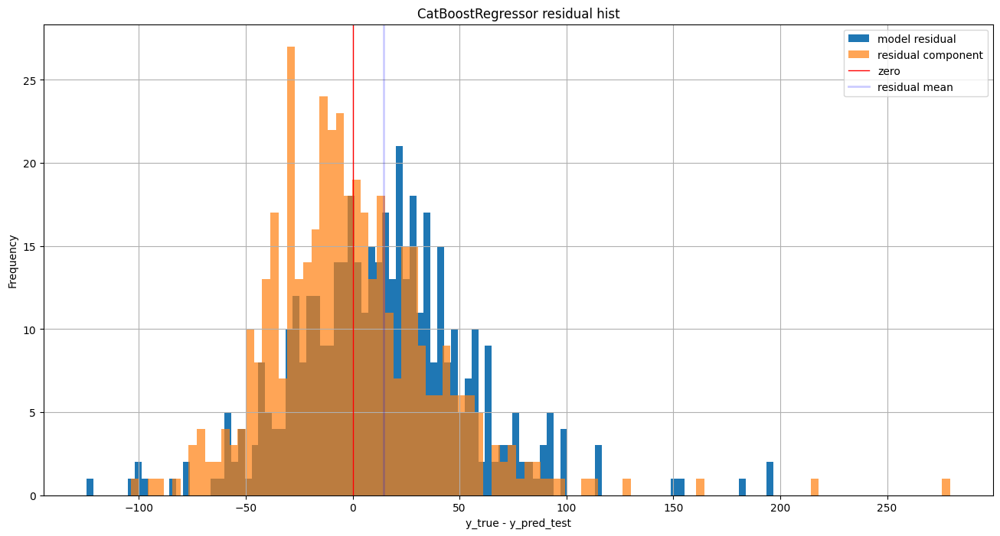

In [36]:
# Построение гистограммы остатков на Test наборе

plt.figure(figsize = (16,8))
plt.hist(y_test - y_pred_test_cb, bins=100, label = 'model residual')
plt.hist(decomposed.resid.loc[X_test.index], bins=100, alpha = 0.7, label = 'residual component')
plt.xlabel('y_true - y_pred_test')
plt.ylabel('Frequency')
plt.axvline(x=0, color='r', linestyle='-', linewidth=1, label = 'zero')
plt.axvline(x=np.mean(y_test - y_pred_test_cb), color='b', linestyle='-', linewidth=2, alpha = 0.2, label = 'residual mean')
plt.legend()
plt.title('CatBoostRegressor residual hist')
plt.grid('true')
plt.show();

### Выводы

Модель CatBoostRegressor с лучшими гиперпараметрами продемонстрировала на тестовой выборке метрику RMSE лучше порогового значения.

Анализ остатков показал нормальное распределение, однако остатки на тестовой выборке имеют ненулевое среднее, что говорит о недообученности модели. С другой стороны, остаточная компонента и остатки модели имеют большие коррелирующие между собой единичные выбросы, которые могут объяснять это смещение, особенно при небольшой тестовой выборке.


## Выводы

Были изучены исторические данные сервиса заказа такси в аэропортах.
Произведены предподготовка, трендовый, статистический и корреляционный анализы данных. Также был проведен feature engineering.


С целью прогнозирования объема спроса на такси в аэропорту были построены 2 модели с оптимизацией гиперпараметров, рассматривались CatBoosstRegressor и LightGBM.


LightGBM и CatBoostRegression продемонстрировали допустимые и схожие RMSE метрики - обе менее требуемых 48. Обе модели выглядят адекватными, однако CatBoostRegression демонстрирует быстродействие на 2 порядка лучше, поэтому рещено выбрать эту модель в качестве рабочей.